#### Import required packages  


24-nov
    - add dbscan to basic clustering ...




<a name='toc'></a>  TOC

* <a href='#me.01.t1'> Modeling and Evaluation 1</a> :
            Train and adjust parameters  
            
  - <a href='#k-means'>K-Means</a>
  - <a href='#end_of_file'> end of file</a>


In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib inline
import warnings
warnings.simplefilter('ignore',DeprecationWarning)
import seaborn as sns
import time
import copy

from pylab import rcParams
#import hdbscan

from sklearn.model_selection import ShuffleSplit
from sklearn.preprocessing import StandardScaler

#from sklearn.datasets import make_blobs

from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score

from sklearn import metrics
from sklearn import metrics as mt
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import confusion_matrix as conf
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score

from sklearn.cluster import KMeans

from tabulate import tabulate

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from __future__ import print_function

#### Read in cleaned  dataset from .csv file  

In [30]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in cleaned data set
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 'mashable_clean_dataset_for_lab_03.csv'

file_2_read = data_dir + data_file
df = pd.read_csv(file_2_read)

df_cluster = copy.deepcopy(df)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... add 'popular' binary based 'shares' values
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_cluster['shares'] = np.exp(df_cluster['ln_shares'])
df_cluster['popular'] = np.where(df_cluster['shares'] > 1400, 1, 0)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in t-SNE vectors
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 't_sne_mapping_perplex_0100.csv'

file_2_read = data_dir + data_file
df_tsne = pd.read_csv(file_2_read)

df_tsne.head()

,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,global_subjectivity,global_rate_positive_words,rate_positive_words,...,ln_self_reference_avg_sharess,ln_LDA_00,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares
0,0.757447,-1.164821,0,1,0,-0.112902,0,0.670593,0.346403,0.457827,...,-0.139965,1.320242,1.235123,-0.643623,-0.631127,-0.692339,-0.266190,0.100486,0.248162,-1.171081
1,-0.661657,-1.688626,0,0,0,-0.112902,0,-0.875228,0.201534,0.269096,...,-2.032745,2.255159,-0.413498,-0.597044,-0.592009,-0.647786,-0.080881,-0.937038,-0.740381,-0.976042
2,-0.661657,-0.641015,0,0,0,-0.112902,0,2.218418,0.989601,0.920026,...,0.047434,0.248240,-0.510740,-0.674579,-0.666507,1.573640,-0.660825,0.100486,-0.740381,-0.173712
3,-0.661657,-0.117210,0,1,0,-0.112902,0,-0.115874,0.103648,-0.081405,...,-2.032745,-0.619381,1.412882,1.105693,-0.686387,-0.744975,0.386392,0.640207,-0.740381,-0.413529
4,1.230482,-0.117210,0,0,0,-0.112902,0,0.601046,2.008329,0.936179,...,0.423196,-0.619083,-0.537434,-0.696925,-0.687885,2.111239,-0.412983,-0.937038,-0.005038,-1.343719


,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,global_subjectivity,global_rate_positive_words,rate_positive_words,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,0.757447,-1.164821,0,1,0,-0.112902,0,0.670593,0.346403,0.457827,...,1.235123,-0.643623,-0.631127,-0.692339,-0.266190,0.100486,0.248162,-1.171081,0.310032,0
1,-0.661657,-1.688626,0,0,0,-0.112902,0,-0.875228,0.201534,0.269096,...,-0.413498,-0.597044,-0.592009,-0.647786,-0.080881,-0.937038,-0.740381,-0.976042,0.376799,0
2,-0.661657,-0.641015,0,0,0,-0.112902,0,2.218418,0.989601,0.920026,...,-0.510740,-0.674579,-0.666507,1.573640,-0.660825,0.100486,-0.740381,-0.173712,0.840539,0
3,-0.661657,-0.117210,0,1,0,-0.112902,0,-0.115874,0.103648,-0.081405,...,1.412882,1.105693,-0.686387,-0.744975,0.386392,0.640207,-0.740381,-0.413529,0.661312,0
4,1.230482,-0.117210,0,0,0,-0.112902,0,0.601046,2.008329,0.936179,...,-0.537434,-0.696925,-0.687885,2.111239,-0.412983,-0.937038,-0.005038,-1.343719,0.260874,0


,x-tsne,y-tsne,sample_index
0,8.773982,-12.387053,25262
1,6.507675,-7.898915,28135
2,-0.850490,8.604273,35014
3,-4.531376,10.001612,14875
4,-30.166384,1.028799,15743


In [31]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... join t-sne vectors with base data, since we sampled to create
# ...     the t-sne mapping
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_join = df_tsne.join(df_cluster, on = 'sample_index')

df_join.head()


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,8.773982,-12.387053,25262,-0.661657,-0.641015,0,0,0,0.204035,0,...,-0.510728,2.177684,-0.666499,-0.723097,0.863376,0.100486,0.275620,1.917598,6.804593,0
1,6.507675,-7.898915,28135,1.230482,1.454206,0,0,0,-0.234979,0,...,-0.589236,0.511467,-0.726616,1.391734,0.799234,0.100486,-0.740381,0.331411,1.392932,0
2,-0.850490,8.604273,35014,0.284413,1.454206,0,0,0,-0.055565,0,...,-0.589441,-0.285926,-0.724789,0.428270,-0.125650,0.100486,1.195125,0.237898,1.268579,0
3,-4.531376,10.001612,14875,0.757447,1.454206,0,0,0,-0.822032,0,...,-0.588548,-0.274876,-0.726522,1.937072,-1.553284,-0.475120,-0.062851,-1.080744,0.339343,0
4,-30.166384,1.028799,15743,0.757447,-1.688626,0,0,0,2.930478,0,...,-0.408651,-0.597486,1.899937,-0.647785,3.094667,0.100486,1.311338,-1.301977,0.271993,0


In [33]:

col_names = df_join.columns.values.tolist()
col_names
df_join.describe().T


['x-tsne',
 'y-tsne',
 'sample_index',
 'n_tokens_title',
 'num_keywords',
 'data_channel_is_lifestyle',
 'data_channel_is_entertainment',
 'data_channel_is_socmed',
 'kw_avg_max',
 'is_weekend',
 'global_subjectivity',
 'global_rate_positive_words',
 'rate_positive_words',
 'max_positive_polarity',
 'min_negative_polarity',
 'max_negative_polarity',
 'title_sentiment_polarity',
 'abs_title_subjectivity',
 'ln_n_tokens_content',
 'ln_num_hrefs',
 'ln_num_imgs',
 'ln_num_videos',
 'ln_kw_min_min',
 'ln_kw_avg_min',
 'ln_kw_min_max',
 'ln_kw_avg_avg',
 'ln_self_reference_avg_sharess',
 'ln_LDA_00',
 'ln_LDA_01',
 'ln_LDA_02',
 'ln_LDA_03',
 'ln_LDA_04',
 'ln_global_rate_negative_words',
 'ln_min_positive_polarity',
 'ln_abs_title_sentiment_polarity',
 'ln_shares',
 'shares',
 'popular']

,count,mean,std,min,25%,50%,75%,max
x-tsne,13875.0,-0.213377,13.780269,-31.411594,-10.350438,0.104428,10.382295,32.816036
y-tsne,13875.0,0.089814,10.127382,-23.617937,-7.072885,-0.710360,7.135141,25.527163
sample_index,13875.0,19696.454486,11438.496005,1.000000,9678.500000,19755.000000,29537.000000,39641.000000
n_tokens_title,13875.0,-0.000295,0.999301,-3.499864,-0.661657,-0.188622,0.757447,5.960828
num_keywords,13875.0,-0.007202,1.001735,-3.260042,-0.641015,-0.117210,0.930401,1.454206
data_channel_is_lifestyle,13875.0,0.054198,0.226417,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_entertainment,13875.0,0.178523,0.382966,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_socmed,13875.0,0.057802,0.233377,0.000000,0.000000,0.000000,0.000000,1.000000
kw_avg_max,13875.0,-0.008320,0.995490,-1.913229,-0.649583,-0.112902,0.526353,4.335148
is_weekend,13875.0,0.129658,0.335939,0.000000,0.000000,0.000000,0.000000,1.000000


In [34]:


columns_2_keep = ['abs_title_subjectivity',
    'data_channel_is_entertainment',
    'global_rate_positive_words',
    'global_subjectivity',
    'kw_avg_max',
    'ln_abs_title_sentiment_polarity',
    'ln_global_rate_negative_words',
    'ln_kw_avg_avg',
    'ln_kw_avg_min',
    'ln_kw_min_min',
    'ln_LDA_00',
    'ln_LDA_01',
    'ln_LDA_02',
    'ln_LDA_03',
    'ln_LDA_04',
    'ln_min_positive_polarity',
    'ln_n_tokens_content',
    'ln_num_hrefs',
    'ln_num_imgs',
    'ln_num_videos',
    'ln_self_reference_avg_sharess',
    'ln_shares',
    'max_negative_polarity',
    'max_positive_polarity',
    'min_negative_polarity',
    'rate_positive_words',
    'sample_index',
    'title_sentiment_polarity',
    'x-tsne',
    'y-tsne'
    ]


df_join = df_join[columns_2_keep]

col_names = df_join.columns.values.tolist()
col_names
df_join.describe().T

['abs_title_subjectivity',
 'data_channel_is_entertainment',
 'global_rate_positive_words',
 'global_subjectivity',
 'kw_avg_max',
 'ln_abs_title_sentiment_polarity',
 'ln_global_rate_negative_words',
 'ln_kw_avg_avg',
 'ln_kw_avg_min',
 'ln_kw_min_min',
 'ln_LDA_00',
 'ln_LDA_01',
 'ln_LDA_02',
 'ln_LDA_03',
 'ln_LDA_04',
 'ln_min_positive_polarity',
 'ln_n_tokens_content',
 'ln_num_hrefs',
 'ln_num_imgs',
 'ln_num_videos',
 'ln_self_reference_avg_sharess',
 'ln_shares',
 'max_negative_polarity',
 'max_positive_polarity',
 'min_negative_polarity',
 'rate_positive_words',
 'sample_index',
 'title_sentiment_polarity',
 'x-tsne',
 'y-tsne']

,count,mean,std,min,25%,50%,75%,max
abs_title_subjectivity,13875.0,0.006242,1.000139,-1.810719,-0.927896,0.837749,0.837749,0.837749
data_channel_is_entertainment,13875.0,0.178523,0.382966,0.000000,0.000000,0.000000,0.000000,1.000000
global_rate_positive_words,13875.0,-0.003472,0.989062,-2.273573,-0.640051,-0.034452,0.595301,5.586357
global_subjectivity,13875.0,0.004785,0.987856,-3.799778,-0.401556,0.087758,0.549846,4.341927
kw_avg_max,13875.0,-0.008320,0.995490,-1.913229,-0.649583,-0.112902,0.526353,4.335148
ln_abs_title_sentiment_polarity,13875.0,-0.004692,0.996795,-0.740381,-0.740381,-0.740381,0.543219,3.246844
ln_global_rate_negative_words,13875.0,0.001542,1.008459,-1.553284,-0.645480,-0.114474,0.477034,14.498911
ln_kw_avg_avg,13875.0,-0.016681,1.081553,-16.296139,-0.405329,-0.030362,0.429665,5.528052
ln_kw_avg_min,13875.0,-0.012524,1.022033,-4.682076,-0.296591,0.152487,0.512994,4.735563
ln_kw_min_min,13875.0,0.002604,1.001299,-0.677671,-0.677671,-0.677671,0.356230,2.650830


In [35]:
# set required variables for model comparison

kmeans_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit

models = []

<a href='#toc'> Table of Contents</a>

<a name='k-means'></a>
<font color="blue" size=3>K-Means

### K-Means  



n_lda =  2


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  2215633.32724
silhouette =  0.395878171195
0 -12.6039641979 -3.65912278515 0
1 9.60210690793 3.05961946952 1


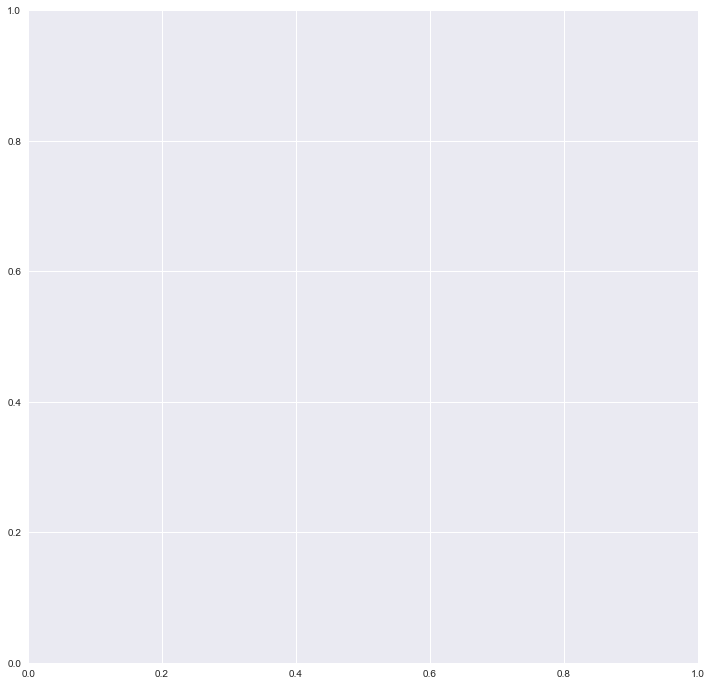

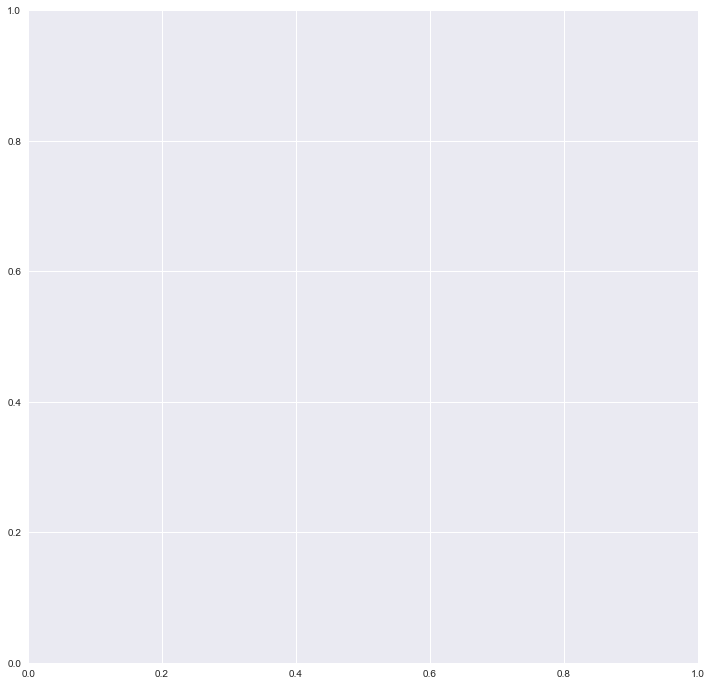

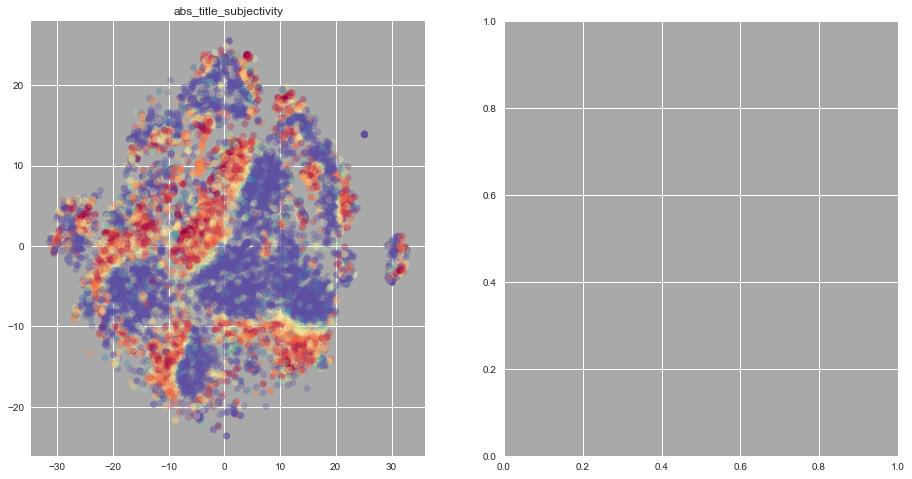

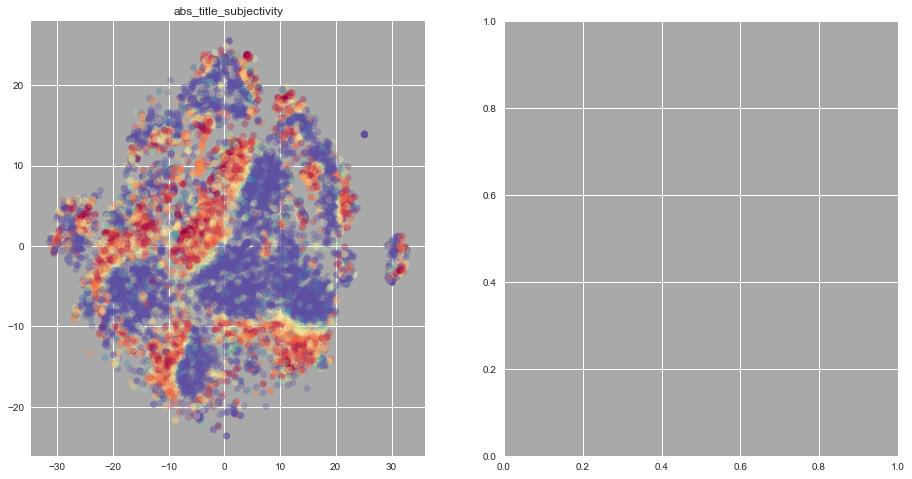

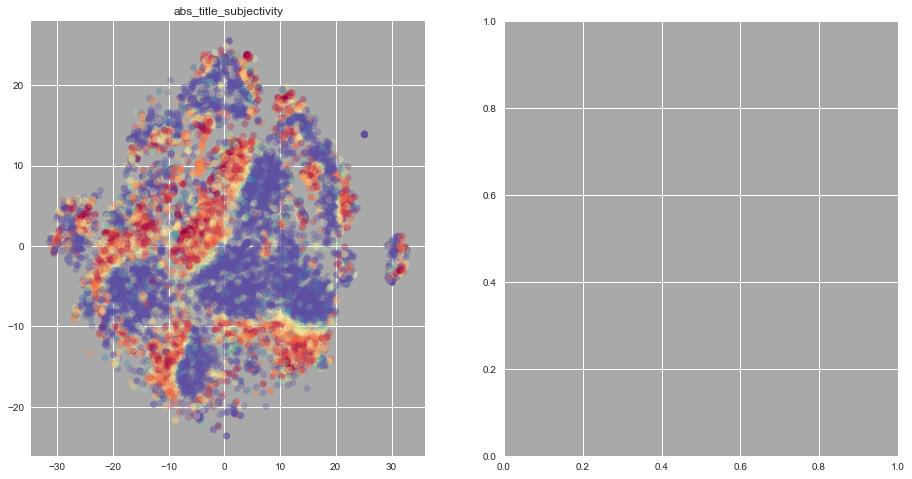

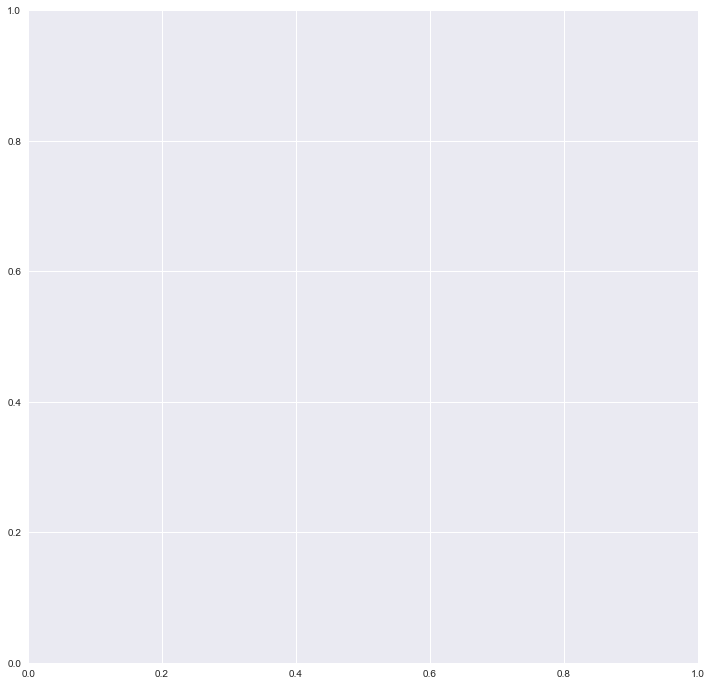

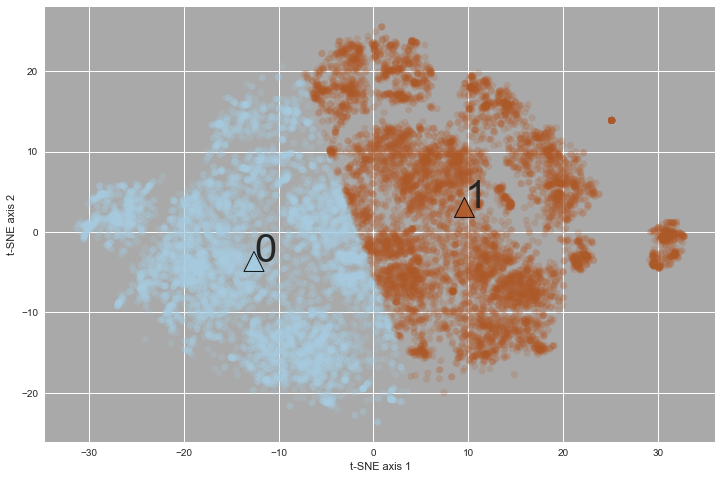

n_lda =  3


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  1476096.0674
silhouette =  0.39514396832
0 13.4462022973 -4.05860204855 0
1 -13.4723391933 -5.29768754888 1
2 1.60800307942 11.839879651 2


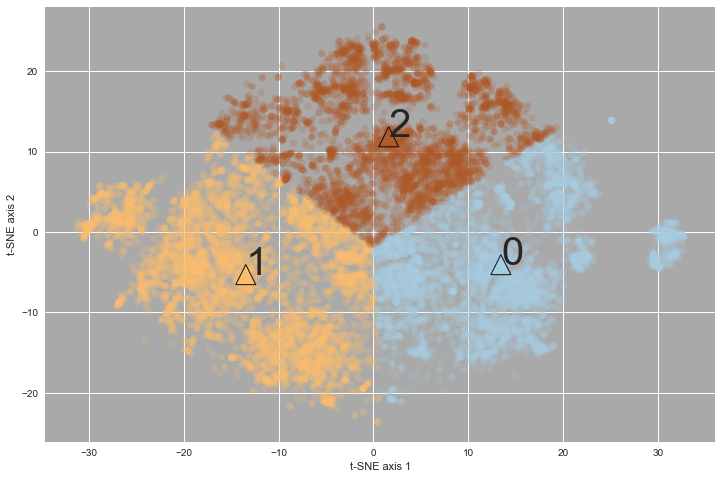

n_lda =  4


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  1052750.50826
silhouette =  0.402359814817
0 2.29657784512 12.1108291006 0
1 -18.4215866216 -0.621936336463 1
2 -2.76002616942 -9.21134081696 2
3 17.0903627939 -2.67349340904 3


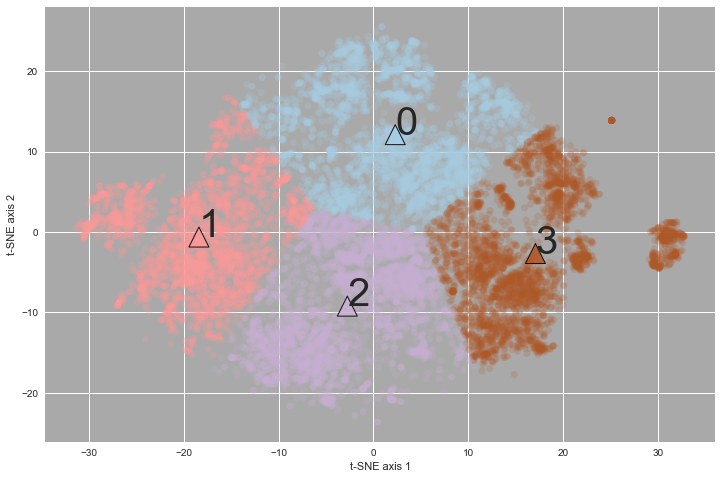

n_lda =  5


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  864387.740283
silhouette =  0.382991471675
0 11.9865489563 8.36724075372 0
1 -19.5558798054 -2.06054741432 1
2 -3.40547094716 12.6078556522 2
3 -3.01841121165 -9.17485194832 3
4 16.843847027 -6.43698670243 4


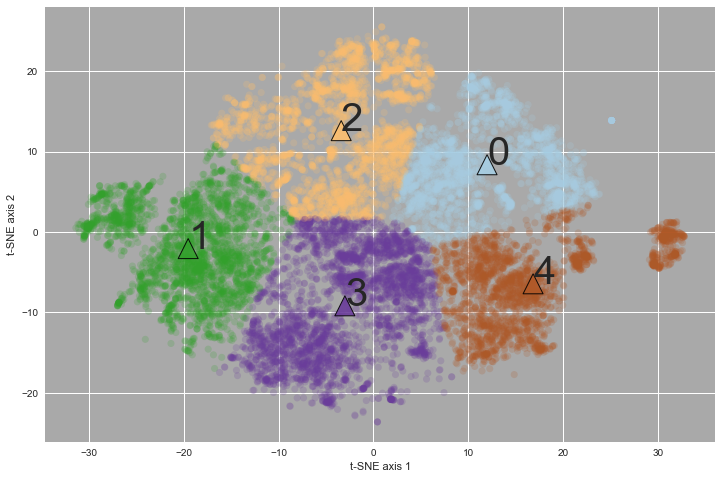

n_lda =  6


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  698587.34086
silhouette =  0.411158386173
0 13.1673539441 9.09141499619 0
1 -0.104344052086 -1.26965069081 1
2 -6.22007928213 -14.4944467079 2
3 -19.5115300568 -1.65840479893 3
4 17.0259378734 -6.5821401253 4
5 -2.91063610672 15.0691655243 5


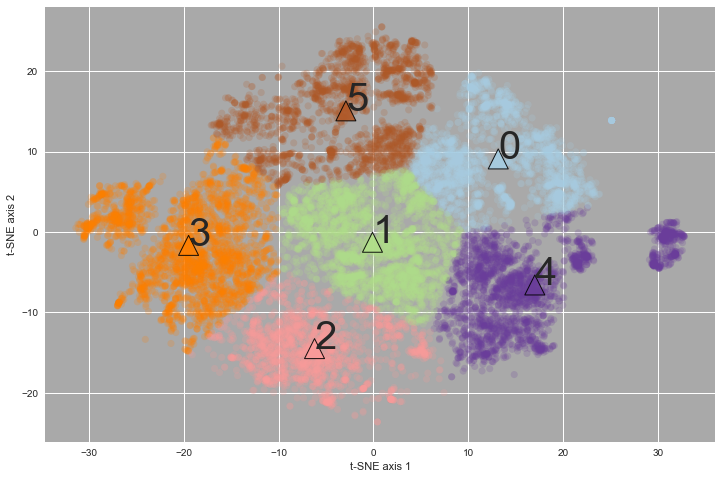

n_lda =  7


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  569401.707954
silhouette =  0.417739380928
0 -19.6477175283 -1.56593868112 0
1 -1.41413328218 -1.21359889915 1
2 -3.74627915575 15.6762421161 2
3 24.1500939032 1.7619453046 3
4 12.0483384301 -8.34782241093 4
5 9.36469985781 9.59751705297 5
6 -7.2589597934 -14.5090979452 6


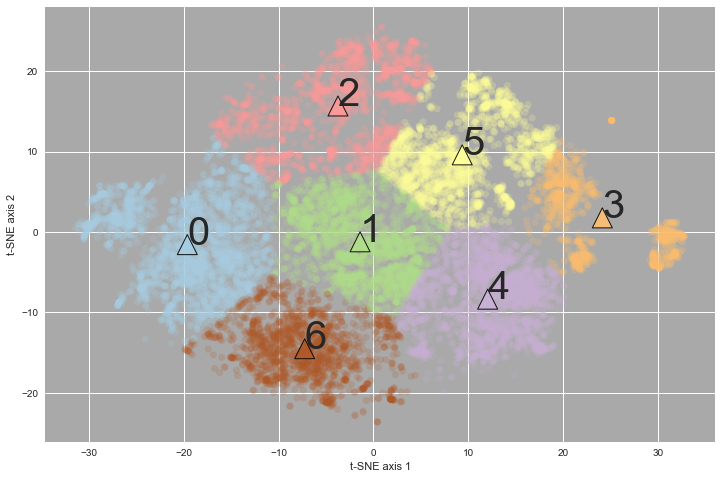

n_lda =  8


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  489151.32
silhouette =  0.407112797673
0 9.0710024153 9.35982880856 0
1 -20.3401429383 -2.48866879524 1
2 12.8357693679 -8.48994966539 2
3 -7.61495649354 -14.599475576 3
4 24.1224342323 1.87002358366 4
5 0.613567006744 -3.77122033188 5
6 -0.456783390823 18.3201265449 6
7 -9.00794479907 7.18960018959 7


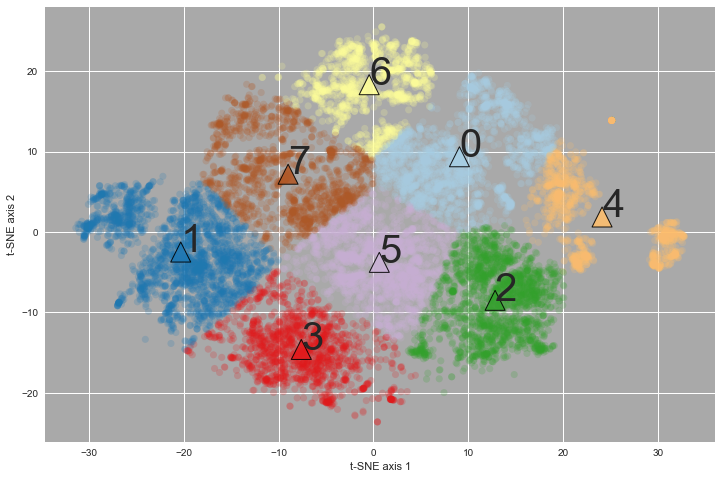

n_lda =  9


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  430776.757881
silhouette =  0.419914421854
0 26.4920484372 -1.07457344638 0
1 -9.86408482778 7.08334893559 1
2 15.9721656709 10.5372856626 2
3 -20.4209596994 -2.58062312026 3
4 4.9638784926 7.44785074083 4
5 -7.66741500524 -14.6340927076 5
6 12.8244827212 -8.46099156559 6
7 -0.600132808752 19.0868392098 7
8 0.396404540643 -4.11709280735 8


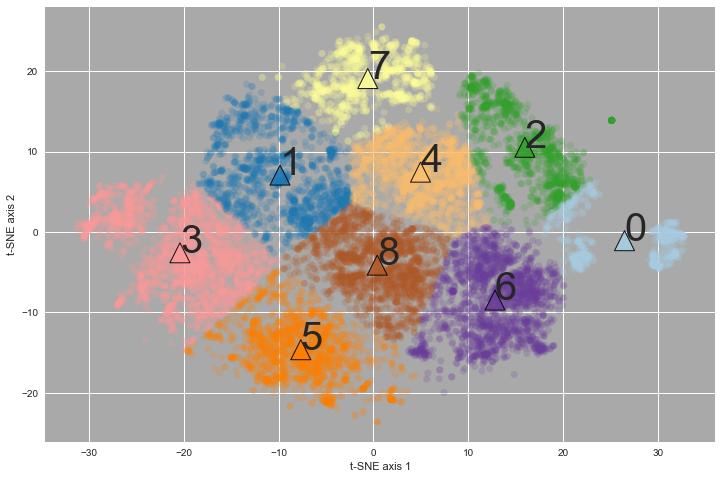

n_lda =  10


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  375832.711608
silhouette =  0.41925849621
0 26.5037312033 -1.07863028627 0
1 0.381019906896 -4.00394398012 1
2 -17.7218588122 -5.43799975134 2
3 15.973845834 10.5302158117 3
4 -7.03242223361 -15.0823992101 4
5 -24.729264951 2.00277749816 5
6 12.8248260175 -8.45302390824 6
7 -9.99663294873 7.15812728128 7
8 -0.576888275682 19.0959552669 8
9 4.95379153382 7.45350191046 9


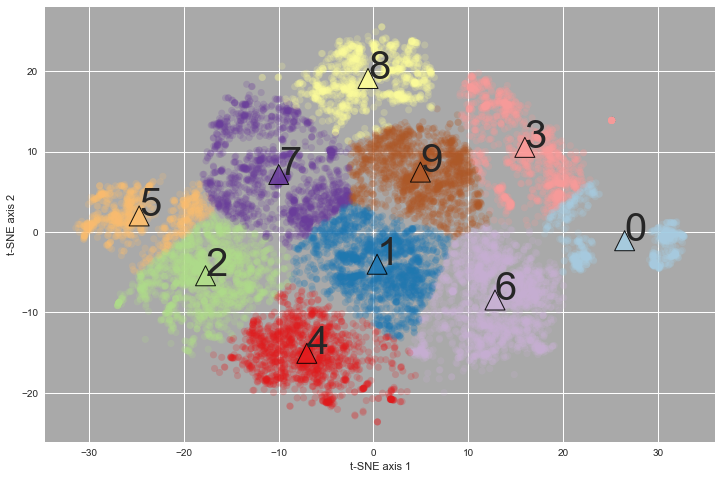

n_lda =  11


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=11, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  334638.717155
silhouette =  0.417859825961
0 -4.56514688549 1.33047138047 0
1 26.5190441998 -1.05845440251 1
2 16.0218400609 10.5881696146 2
3 -12.0709256369 9.5066819984 3
4 2.38191338409 -6.07519150881 4
5 -7.21989786177 -15.0951072126 5
6 -17.8265390899 -5.38013822678 6
7 -0.498336242194 19.0867466538 7
8 -24.8200365366 2.03217804446 8
9 5.33716685563 7.53417066854 9
10 13.4852488664 -8.26713764763 10


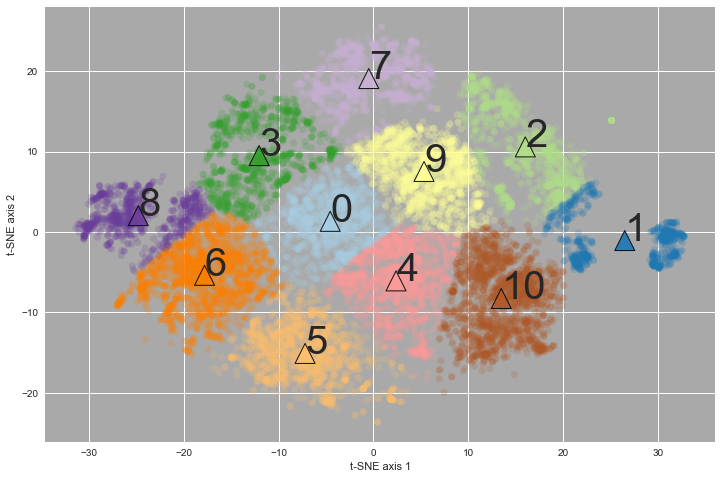

n_lda =  12


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=12, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  301663.792459
silhouette =  0.42845270505
0 5.37633214275 7.5395883454 0
1 -17.8225564985 -5.39790094176 1
2 2.38429443969 -6.08224529545 2
3 -24.8021236434 2.01467646217 3
4 13.4789734585 -8.30148712932 4
5 -12.0761555298 9.49035706548 5
6 12.3419061158 15.5425307551 6
7 18.6364167531 6.80393595136 7
8 27.9118340151 -2.08909270509 8
9 -4.55722498655 1.3259183449 9
10 -7.22571417027 -15.0956197238 10
11 -0.536000728483 19.1045378583 11


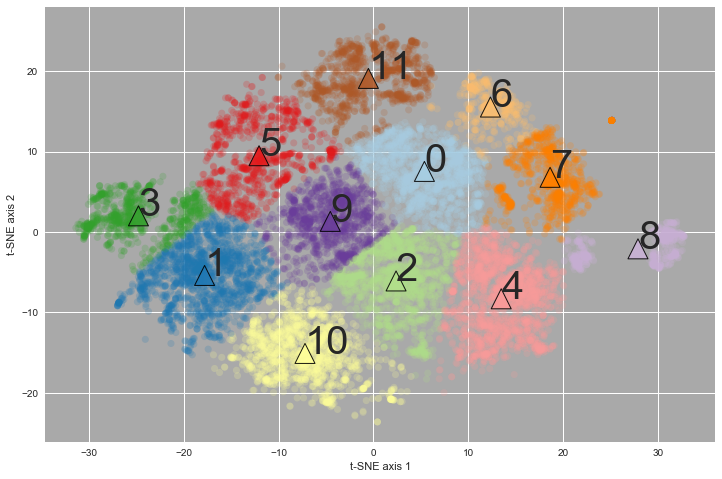

n_lda =  13


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=13, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  274767.168166
silhouette =  0.425091066474
0 -17.8289010339 -5.39179782663 0
1 11.8666975835 -12.9256569742 1
2 -4.91140219614 1.97798590424 2
3 5.27852596799 7.69032073219 3
4 1.65512917032 -5.25908846256 4
5 12.3159411949 15.5289709185 5
6 -7.22462005504 -15.0727299505 6
7 27.9793319237 -2.08644068425 7
8 -24.8287581271 2.02913043052 8
9 13.5492537696 -5.13102909597 9
10 18.7017146131 6.93481075633 10
11 -0.544743656216 19.1309966383 11
12 -12.2701359642 9.5157924004 12


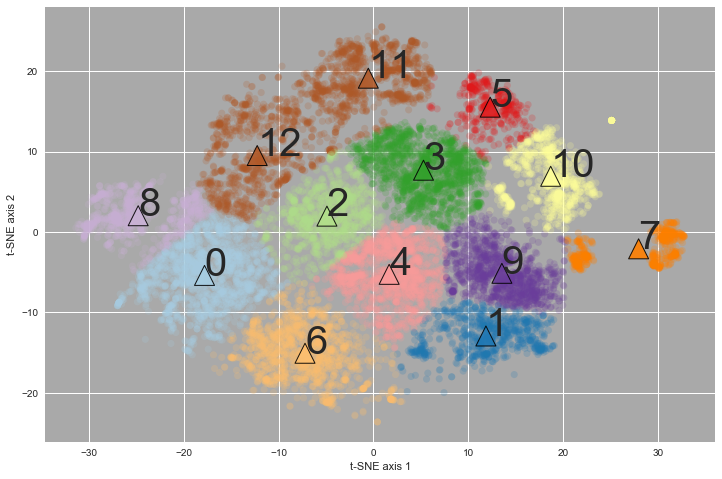

n_lda =  14


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=14, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  251632.983758
silhouette =  0.426221143619
0 -18.4513712405 -6.79618946114 0
1 5.29327359854 7.69393534248 1
2 11.8866314082 -12.9259877317 2
3 -0.422853557821 19.2000627769 3
4 18.7112037726 6.93100018759 4
5 1.78773441263 -5.32110663734 5
6 -26.9045351907 2.02745859421 6
7 -11.09030522 11.1813291619 7
8 27.9793319237 -2.08644068425 8
9 -7.21238884956 -15.0384428748 9
10 12.3552687261 15.5369186011 10
11 -16.6855441164 0.923153912201 11
12 -4.69141499969 1.73508226627 12
13 13.5731549472 -5.13212788817 13


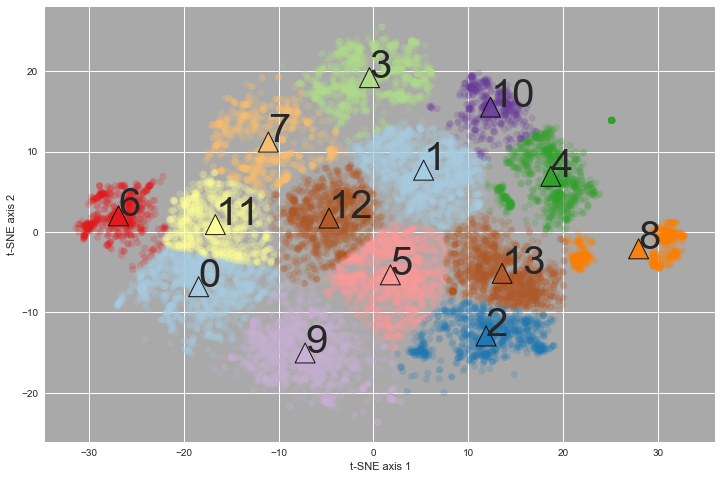

n_lda =  15


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=15, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  234437.746119
silhouette =  0.414682544074
0 13.3664719923 -4.87566955752 0
1 -11.1200072173 11.1886991003 1
2 2.10199363889 -14.3298898339 2
3 13.2648769137 -12.327773452 3
4 -18.5465580182 -6.76112734475 4
5 1.50599775487 -4.43654484789 5
6 -4.78910583212 2.02964364605 6
7 27.9659168409 -2.08505530706 7
8 -8.08417676439 -14.6606091482 8
9 12.3608541581 15.5472146255 9
10 -26.9459163236 2.09099265729 10
11 5.30622789278 7.72090174282 11
12 -16.6694095204 0.901281406201 12
13 -0.422853557821 19.2000627769 13
14 18.718484443 6.93587032067 14


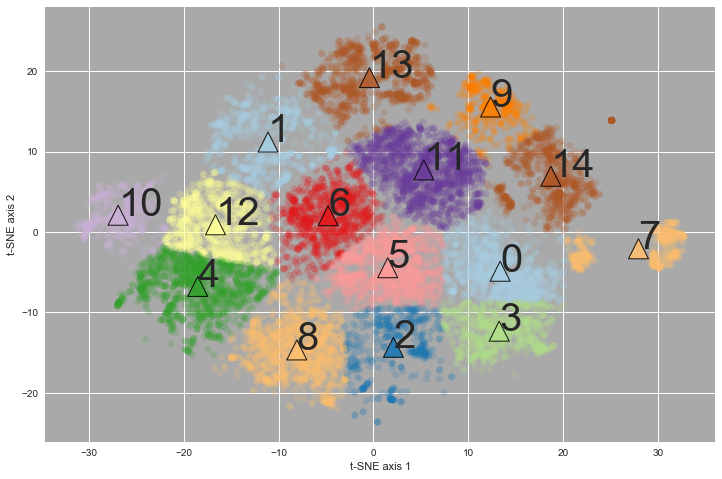

n_lda =  16


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=16, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  218229.502138
silhouette =  0.410537947184
0 -16.4620316754 0.493861605233 0
1 7.13595364652 6.52884329112 1
2 12.9937877617 -12.468903178 2
3 -0.388538576116 19.4340785618 3
4 -8.87157984467 -14.0182822207 4
5 -26.9486977545 2.1029046949 5
6 18.7477121789 6.95049812009 6
7 -4.84272663573 1.52307193161 7
8 -11.7973957892 11.2148529196 8
9 -19.0473679527 -6.84359948165 9
10 1.7787872012 -4.76451996083 10
11 -0.31029920609 -15.892559518 11
12 12.3550694415 15.6750034033 12
13 27.9793319237 -2.08644068425 13
14 0.506614242683 9.95092161657 14
15 13.5820255487 -5.10775579356 15


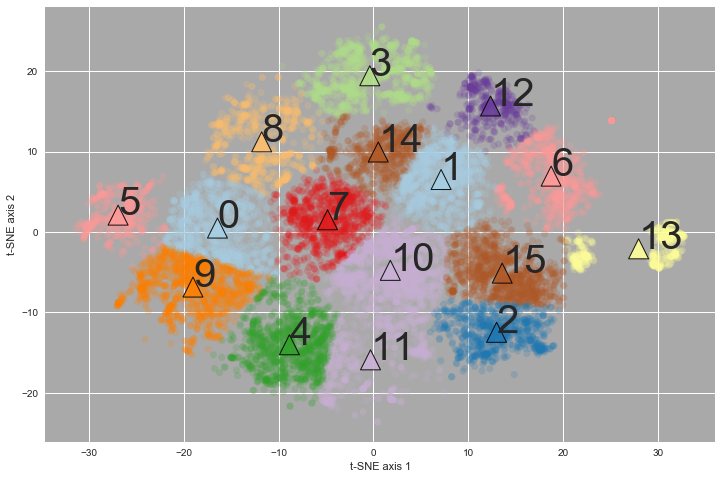

n_lda =  17


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=17, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  203271.549328
silhouette =  0.415544049512
0 18.0900215726 -5.37091161971 0
1 -4.97503952351 1.76844092997 1
2 12.3534121917 15.7063723396 2
3 -16.6973715446 0.949070684483 3
4 7.07075584082 6.74835360708 4
5 -8.13338750867 -14.6523979616 5
6 13.062452705 -12.2114379015 6
7 -11.7680808249 11.2486346551 7
8 1.12140061288 -4.46268642135 8
9 18.7420353097 7.04447777876 9
10 -18.5090856831 -6.7366650597 10
11 30.8272737921 -1.63820544985 11
12 1.98149040107 -14.4335663214 12
13 0.512270507896 9.95937447369 13
14 -26.9285057422 2.06329715112 14
15 10.7656182338 -3.7641957302 15
16 -0.383144745946 19.4387633183 16


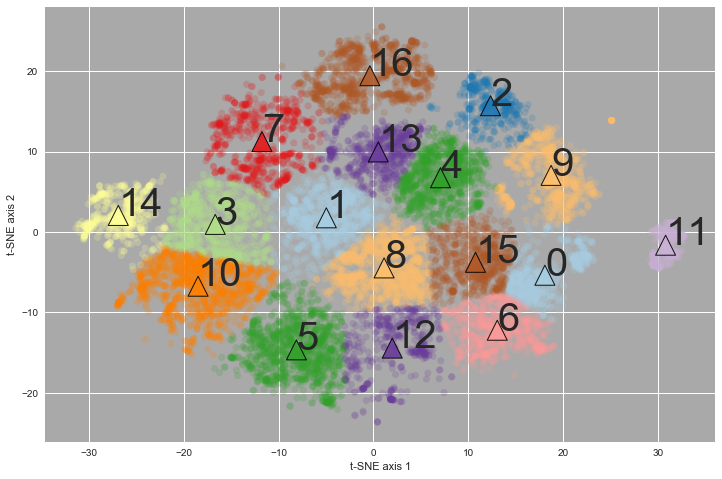

n_lda =  18


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=18, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  188869.836194
silhouette =  0.419235749922
0 -4.9066661902 2.06000537052 0
1 12.3733182059 15.6912770113 1
2 -17.1113396472 2.00574551652 2
3 18.0696787176 -5.40092425728 3
4 2.18332988451 -14.2466697031 4
5 -27.0653826961 2.20136328207 5
6 -0.375788763547 19.4405657769 6
7 -7.9606944868 -14.9719756736 7
8 30.8272737921 -1.63820544985 8
9 18.7473281603 7.01785922457 9
10 0.538424639095 9.97866164192 10
11 1.04035623843 -4.40071368675 11
12 -20.6997471319 -6.38210872147 12
13 7.07075584082 6.74835360708 13
14 -13.8619104092 -6.04120609581 14
15 10.7331984502 -3.78632409289 15
16 -11.6744429985 11.4109292694 16
17 13.0664243636 -12.2283024182 17


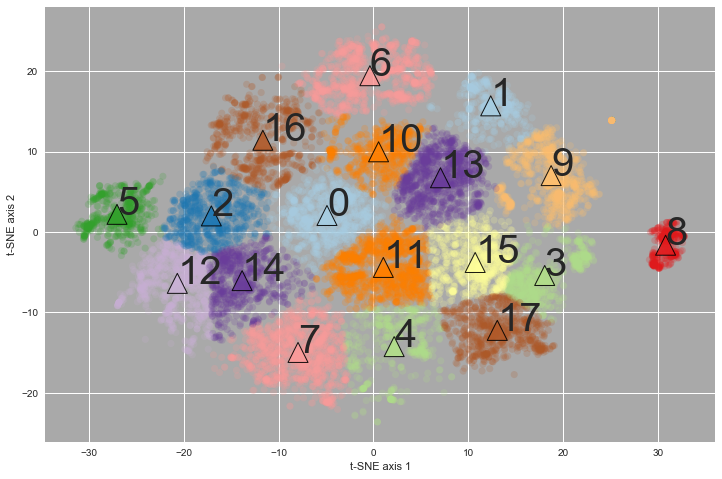

n_lda =  19


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=19, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  178498.403354
silhouette =  0.417114770597
0 13.0703874892 -12.2174831719 0
1 -13.8129350347 -5.97371100183 1
2 0.655809875317 9.87774759426 2
3 2.9182633819 19.9274931675 3
4 18.746433034 7.03230671854 4
5 1.03634082657 -4.39767931942 5
6 -7.9606944868 -14.9719756736 6
7 -17.1737977521 1.89980030362 7
8 -27.0653826961 2.20136328207 8
9 -4.90301943989 2.07252952089 9
10 12.4440040396 15.6929085308 10
11 18.0962973251 -5.36888209991 11
12 7.08708090687 6.74428415651 12
13 30.8272737921 -1.63820544985 13
14 -20.6782390634 -6.44480833422 14
15 -3.50879310421 18.7470485903 15
16 10.7333386262 -3.80961494017 16
17 2.18332988451 -14.2466697031 17
18 -11.8332740687 11.1792050107 18


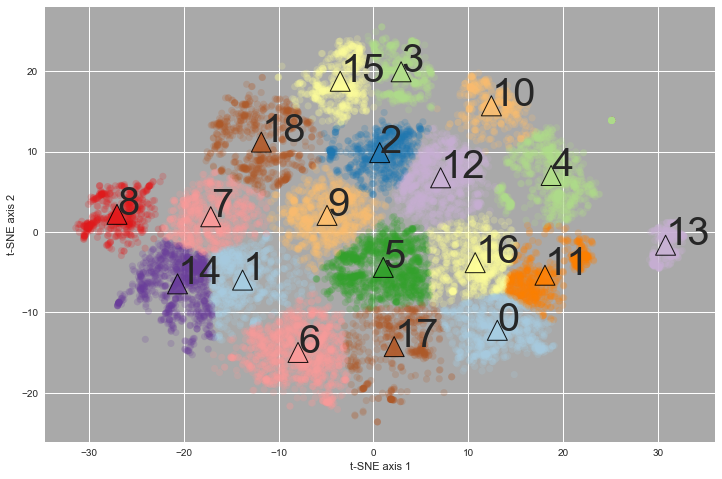

n_lda =  20


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=20, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  169407.513822
silhouette =  0.408804451774
0 3.3390149331 -4.1960761039 0
1 -8.01382654704 -15.0680350824 1
2 1.67670740866 20.4117387735 2
3 -17.4006094128 1.59940474465 3
4 18.7482593302 7.0571117506 4
5 13.1176113337 -12.1627016881 5
6 12.3677903712 15.7065609097 6
7 -4.86267930509 16.9136441304 7
8 -4.89479271022 2.44209882244 8
9 7.14871516228 6.70979856564 9
10 30.8272737921 -1.63820544985 10
11 2.10309981231 -14.4268708722 11
12 -12.5566850366 10.4246042457 12
13 11.5140615467 -3.90739613362 13
14 -27.0740632109 2.20444333933 14
15 18.471051534 -5.24588021655 15
16 0.85170914047 9.81416999356 16
17 -20.7816224895 -6.52361203654 17
18 -2.55724797498 -4.84443279975 18
19 -14.0827374915 -6.04573274813 19


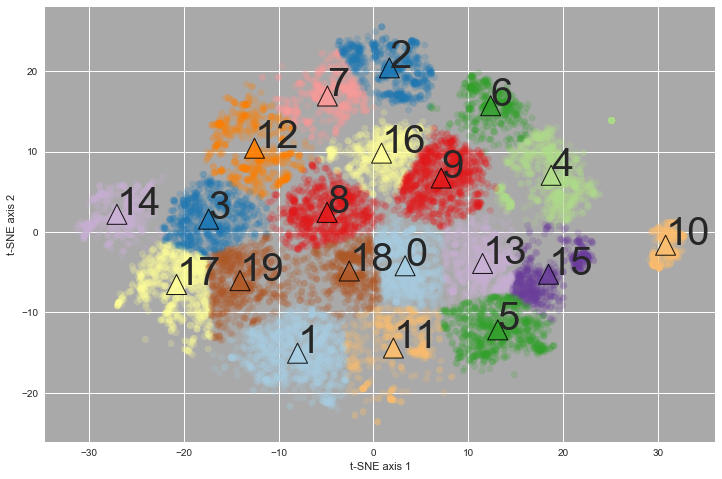

In [36]:
# ... k-means on the t-sne vectors

X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']

for n_lda in range(2, 21):  

    tic = time.clock()
    
    print ("n_lda = ", n_lda)

    cls_lda = KMeans(n_clusters = n_lda,
                     init = 'k-means++',
                     random_state = 1);
    
    cls_lda.fit(X_tsne)

    kmeans_labels = cls_lda.labels_ # the labels from kmeans clustering
    kmeans_centers = cls_lda.cluster_centers_

    kmeans_inertia = cls_lda.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = metrics.silhouette_score(X_tsne,
                                                 kmeans_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", kmeans_silhouette)
    
    toc =  time.clock()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {
    'model_name' : 'KMeans - downselected features',
    'n_clusters' : n_lda,
    'inertia': kmeans_inertia,
    'silhouette': kmeans_silhouette, 
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    kmeans_tbl = kmeans_tbl.append(df_tbl)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    X_tsne_values = X_tsne.values;
    _ = plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1],
                c = kmeans_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1],
                c = range(n_lda),
                cmap = plt.cm.Paired,
                s = 400,
                linewidths = 1.0,
                marker = '^',
                edgecolors = 'black',
                alpha = 0.90);
    
    for ii in range(n_lda) :                                       
        _ = plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 40)
        print(ii, kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii)
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2');
    _ = plt.grid(True);

    plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - 
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-



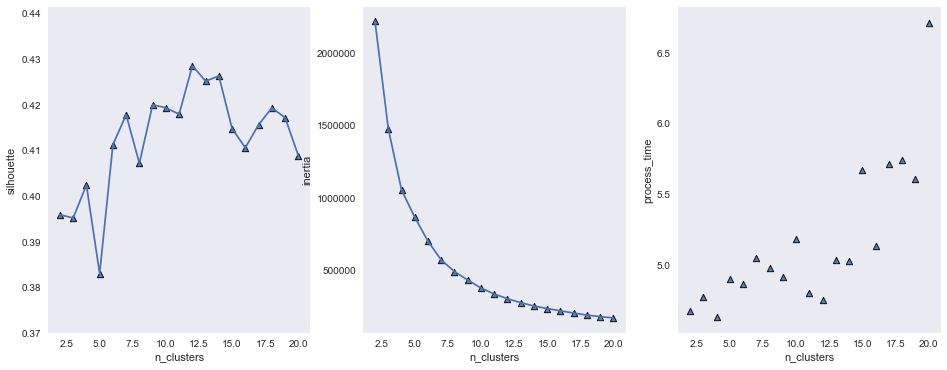

In [37]:

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot metrics across models for comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

plt.figure(figsize=(16, 6));

# ... silhouette values

plt.subplot(131);
plt.scatter(kmeans_tbl['n_clusters'],
            kmeans_tbl['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(kmeans_tbl['n_clusters'],
         kmeans_tbl['silhouette'])

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
plt.grid();

# ... inertia values

plt.subplot(132);
plt.scatter(kmeans_tbl['n_clusters'],
            kmeans_tbl['inertia'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(kmeans_tbl['n_clusters'],
         kmeans_tbl['inertia'])

plt.xlabel('n_clusters'), plt.ylabel('inertia');
plt.grid();

# ... process time

plt.subplot(133);
plt.scatter(kmeans_tbl['n_clusters'],
            kmeans_tbl['process_time'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

#plt.plot(kmeans_tbl['n_clusters'],
#         kmeans_tbl['process_time'])

plt.xlabel('n_clusters'), plt.ylabel('process_time');
plt.grid();


plt.show();


### - choose kmeans clustering with preferred number of clusters  


n_lda =  12


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=12, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  301663.792459
silhouette =  0.428826417108


0 5.37633214275 7.5395883454 0


1 -17.8225564985 -5.39790094176 1


2 2.38429443969 -6.08224529545 2


3 -24.8021236434 2.01467646217 3


4 13.4789734585 -8.30148712932 4


5 -12.0761555298 9.49035706548 5


6 12.3419061158 15.5425307551 6


7 18.6364167531 6.80393595136 7


8 27.9118340151 -2.08909270509 8


9 -4.55722498655 1.3259183449 9


10 -7.22571417027 -15.0956197238 10


11 -0.536000728483 19.1045378583 11
[4 2 0 ..., 9 0 0]
[[  5.37633214   7.53958835]
 [-17.8225565   -5.39790094]
 [  2.38429444  -6.0822453 ]
 [-24.80212364   2.01467646]
 [ 13.47897346  -8.30148713]
 [-12.07615553   9.49035707]
 [ 12.34190612  15.54253076]
 [ 18.63641675   6.80393595]
 [ 27.91183402  -2.08909271]
 [ -4.55722499   1.32591834]
 [ -7.22571417 -15.09561972]
 [ -0.53600073  19.10453786]]


(<matplotlib.text.Text at 0x7fd2302d7d68>,
 <matplotlib.text.Text at 0x7fd2347df3c8>)

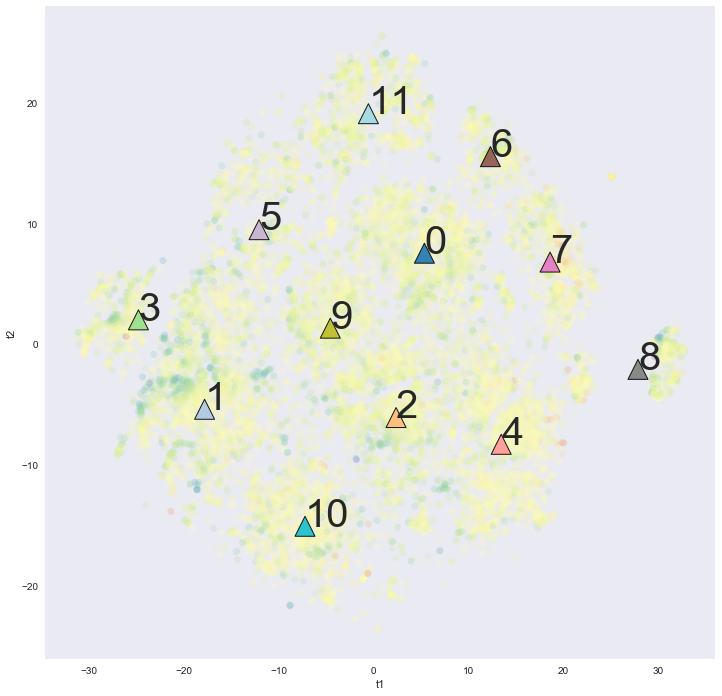

In [39]:

n_clusters_chosen = 12

for n_lda in [n_clusters_chosen] :

    tic = time.clock()
    
    print ("n_lda = ", n_lda)

    cls_lda = KMeans(n_clusters = n_lda,
                     init = 'k-means++',
                     random_state = 1);
    
    cls_lda.fit(X_tsne)

    kmeans_labels = cls_lda.labels_ # the labels from kmeans clustering
    kmeans_centers = cls_lda.cluster_centers_

    kmeans_inertia = cls_lda.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = metrics.silhouette_score(X_tsne,
                                                 kmeans_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", kmeans_silhouette)
    
    toc =  time.clock()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    plt.figure(figsize=(12, 12));
    ax = plt.gca();
    
    X_tsne_values = X_tsne.values;
    plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1],
                c = df_join['ln_shares'],
                cmap = plt.cm.Spectral,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1],
                c = range(n_lda),
                cmap = plt.cm.tab20,
                s = 400,
                linewidths = 1.0,
                marker = '^',
                edgecolors = 'black',
                alpha = 0.90);    
    for ii in range(n_lda) :                                       
        plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 40)
        print(ii, kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii)

    print(kmeans_labels)
    print(kmeans_centers)
    
    
    plt.xlabel('t1'), plt.ylabel('t2');
    plt.grid();

    plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - print out comparison table
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-




In [40]:
len(kmeans_labels)


13875

In [41]:

X_all_together = copy.deepcopy(df_join)

len(X_all_together)

X_all_together['kmeans_labels'] = kmeans_labels

X_all_together.describe().T


13875

,count,mean,std,min,25%,50%,75%,max
abs_title_subjectivity,13875.0,0.006242,1.000139,-1.810719,-0.927896,0.837749,0.837749,0.837749
data_channel_is_entertainment,13875.0,0.178523,0.382966,0.000000,0.000000,0.000000,0.000000,1.000000
global_rate_positive_words,13875.0,-0.003472,0.989062,-2.273573,-0.640051,-0.034452,0.595301,5.586357
global_subjectivity,13875.0,0.004785,0.987856,-3.799778,-0.401556,0.087758,0.549846,4.341927
kw_avg_max,13875.0,-0.008320,0.995490,-1.913229,-0.649583,-0.112902,0.526353,4.335148
ln_abs_title_sentiment_polarity,13875.0,-0.004692,0.996795,-0.740381,-0.740381,-0.740381,0.543219,3.246844
ln_global_rate_negative_words,13875.0,0.001542,1.008459,-1.553284,-0.645480,-0.114474,0.477034,14.498911
ln_kw_avg_avg,13875.0,-0.016681,1.081553,-16.296139,-0.405329,-0.030362,0.429665,5.528052
ln_kw_avg_min,13875.0,-0.012524,1.022033,-4.682076,-0.296591,0.152487,0.512994,4.735563
ln_kw_min_min,13875.0,0.002604,1.001299,-0.677671,-0.677671,-0.677671,0.356230,2.650830


In [42]:
col_names = X_all_together.columns.values.tolist()


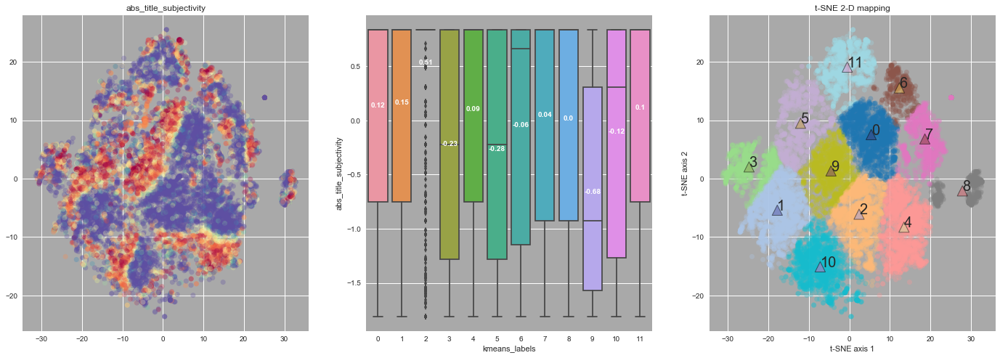

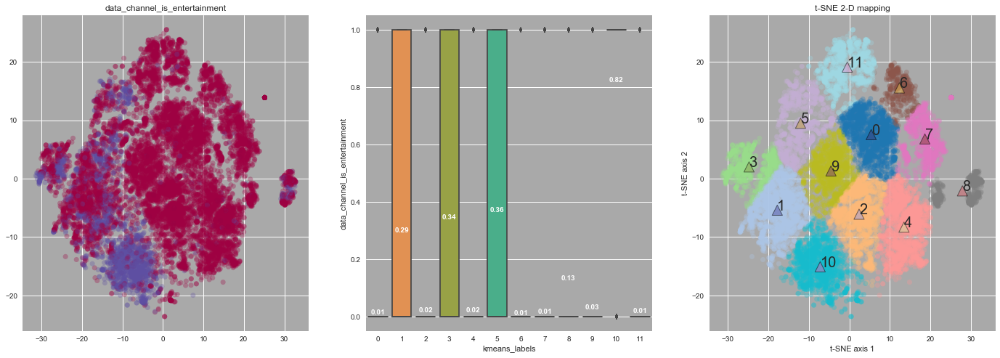

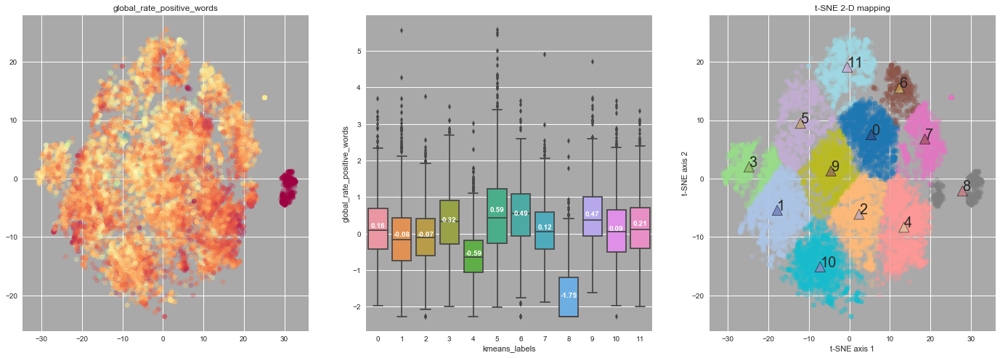

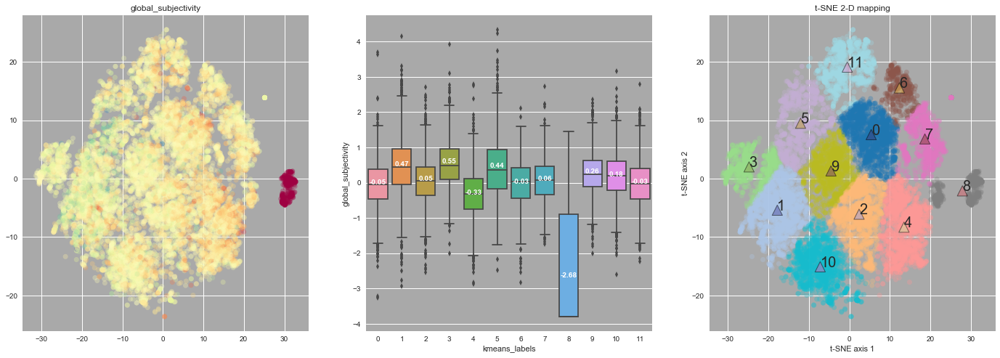

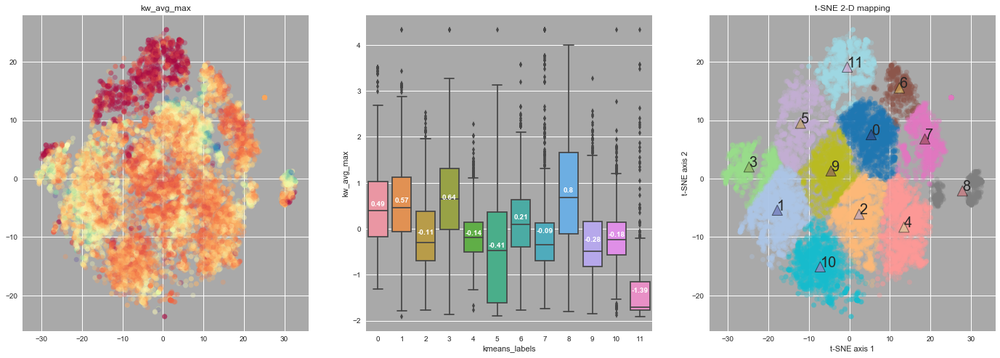

...

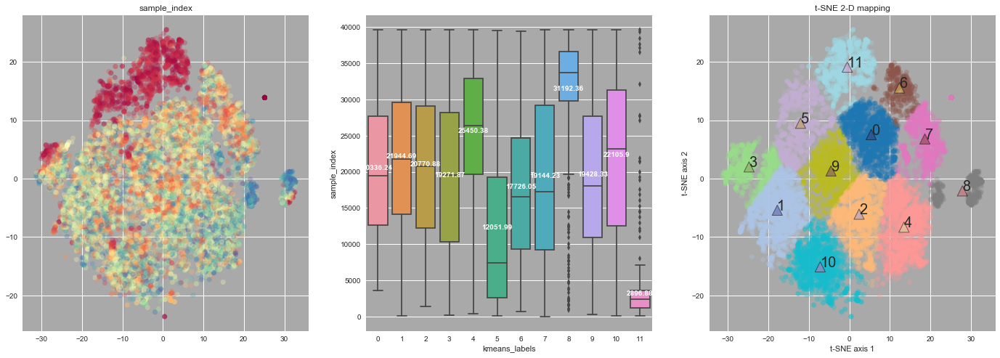

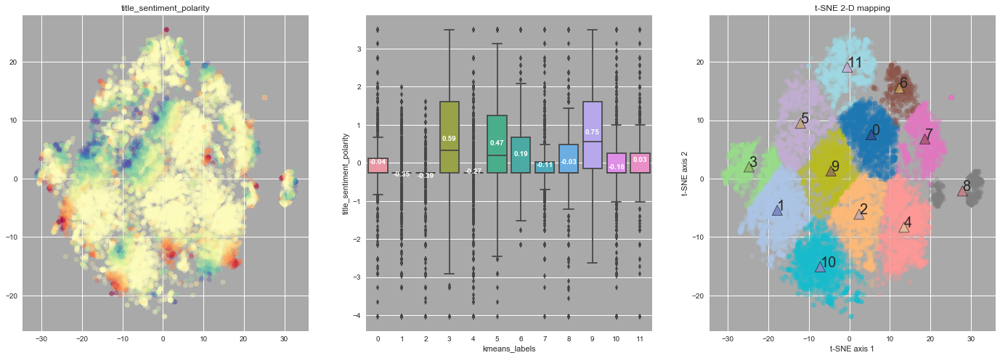

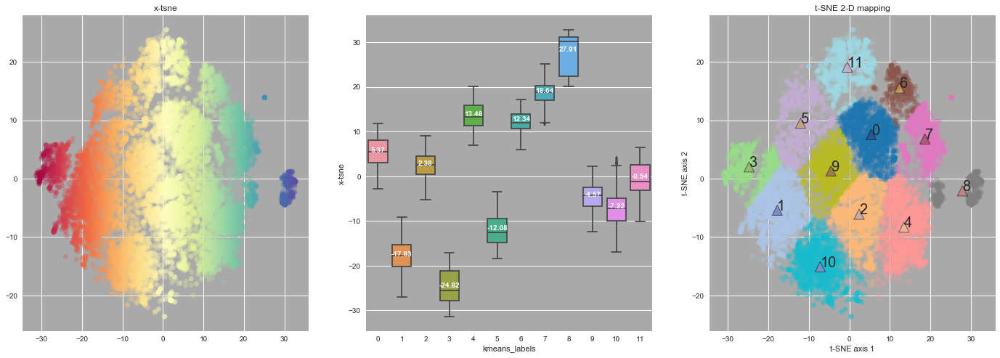

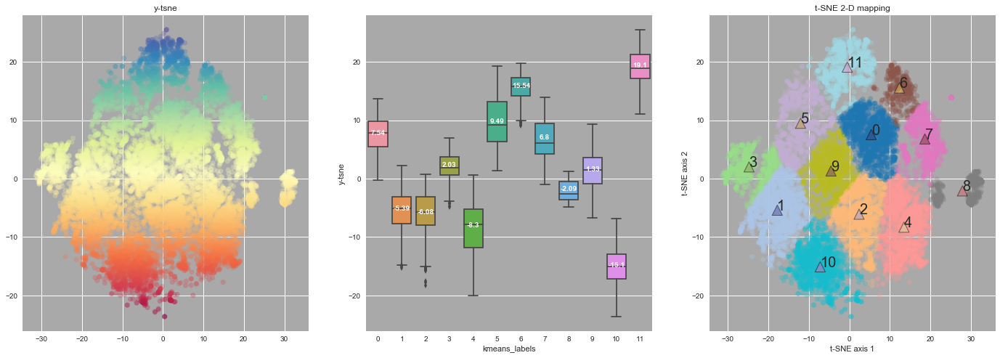

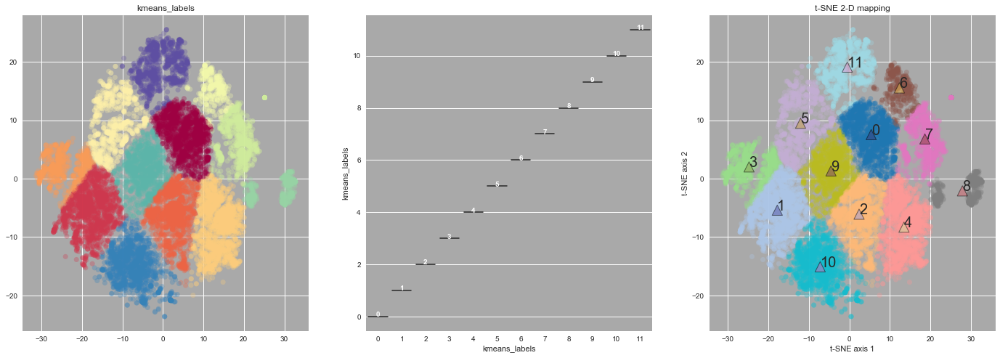

In [43]:
# boxplot across clusters for each feature ...
import seaborn as sns

col_names = X_all_together.columns.values.tolist()

for col in col_names :
    
    _ = plt.figure(figsize=(24, 8));
    
# ... feature distribution color map 

    _ = plt.subplot(131, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = X_all_together[col],
                 cmap = plt.cm.Spectral,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.title(col)
    
# ... feature boxplots

    _ = plt.subplot(132, facecolor = 'darkgrey');
    ax = sns.boxplot(x = "kmeans_labels", y = col, data = X_all_together);
    
    
    average_values = X_all_together.groupby(['kmeans_labels'])[col].mean().values
    average_labels = [str(np.round(s, 2)) for s in average_values]

    pos = range(len(average_values))
    for tick, label in zip(pos, ax.get_xticklabels()):
        
        _ = ax.text(pos[tick], average_values[tick], average_labels[tick], 
                horizontalalignment = 'center', size = 'small', color = 'w', weight = 'semibold')

# ... cluster color map
    
    _ = plt.subplot(133, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = kmeans_labels,
                 cmap = plt.cm.tab20,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1],
                c = range(n_lda),
                cmap = plt.cm.tab20b,
                s = 200,
                linewidths = 1.0,
                marker = '^',
                edgecolors = 'black',
                alpha = 0.50);    
    for ii in range(n_lda) :                                       
        _ = plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 20)
        
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    _ = plt.title('t-SNE 2-D mapping')
    
    plt.savefig("cluster_kmeans_downselect_3way_preplx_100_12_clstrs%s.png" %col)
 
    _ = plt.show();
    

In [48]:
# ... summary table ... relative difference of each feature within each cluster

grouped = X_all_together.groupby(['kmeans_labels'])

cluster_analysis_tbl = (grouped.mean() - X_all_together.mean()) / X_all_together.std()

cluster_analysis_tbl.T


kmeans_labels,0,1,2,3,4,5,6,7,8,9,10,11
abs_title_subjectivity,0.116443,0.144528,0.507006,-0.238936,0.081502,-0.287316,-0.069311,0.031039,-0.003767,-0.683452,-0.125084,0.093695
data_channel_is_entertainment,-0.444495,0.299835,-0.426437,0.421329,-0.426727,0.484386,-0.449311,-0.434136,-0.132429,-0.400425,1.667960,-0.431275
global_rate_positive_words,0.160310,-0.082206,-0.071186,0.324351,-0.592627,0.596868,0.500659,0.126258,-1.770080,0.482280,0.090459,0.215812
global_subjectivity,-0.056685,0.471807,0.048708,0.550005,-0.341397,0.437546,-0.030186,0.056552,-2.715408,0.254320,0.177601,-0.036236
kmeans_labels,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
kw_avg_max,0.500979,0.579586,-0.106488,0.650699,-0.133189,-0.406360,0.220792,-0.079850,0.809149,-0.272259,-0.168994,-1.389547
ln_LDA_00,1.860524,-0.460304,-0.404652,-0.314074,-0.442739,-0.266286,1.868882,-0.236827,-0.466712,-0.314047,-0.444812,0.363660
ln_LDA_01,-0.323967,-0.149902,-0.355062,-0.189759,-0.434695,0.386955,-0.378541,-0.376639,-0.131323,-0.345199,2.208975,-0.298358
ln_LDA_02,-0.437960,-0.519849,-0.253952,-0.517500,1.753151,-0.472832,-0.466202,0.761440,0.392219,-0.413158,-0.351122,-0.037611
ln_LDA_03,-0.540568,1.618940,-0.550466,1.512602,-0.584430,0.834449,-0.563906,-0.525476,0.526926,-0.452582,-0.359121,-0.524114


<a href='#toc'> Table of Contents</a>

<a name='end_of_file'></a>
<font color="blue" size=3>  end of file